In [ ]:
using Pkg
Pkg.activate(@__DIR__)
Pkg.instantiate()
Pkg.resolve()
using Revise, Distributions, GLMakie, Dates, DataFrames, CSV, DataFramesMeta, LinearAlgebra, FFTW
using TrypColonies
import Serialization as s


  Activating project at `c:\Users\Andreas\Dropbox\phd\TrypColonies\TrypColonies`
     Project No packages added to or removed from `C:\Users\Andreas\Dropbox\phd\TrypColonies\TrypColonies\Project.toml`
    Manifest No packages added to or removed from `C:\Users\Andreas\Dropbox\phd\TrypColonies\TrypColonies\Manifest.toml`


In [6]:
data_path = find_data_path(local_data = false)

"C:\\Users\\Andreas\\Desktop\\simulation_data_julia\\"

In [7]:
data_base = s.deserialize("data_base\\df.jls") 
data_base = @subset(data_base, :location .== data_path)   
@transform!(data_base, :doubling_time = 1 ./log2.(1 .+:growth_rate) ./3600)
data_base

Row,radius_tanget,scale_fac,agent_number,noise_dis,velo_var_relative,sweep_parameter,sampling_interval,L,path,walker_step_size,unix_date,run_time,location,name,N,parameter_increment,Diff_coe,adsorption_rate,storage,noise_strength,grid_recover_rate,iterations,growth_rate,Diameter_colony,parameter_steps,velocity_dis,radius_collision,date,walker_speed_phy,decay_rate,grid_strength,total_time,doubling_time,Δt_walker_min
,Int64,Int64,Int64,UnionAll,Float64,String,Int64,Tuple…,String?,Int64,Float64?,Float64?,String?,String?,Tuple…,Float64,Float64,Float64,Float64?,Float64,Float64,Int64,Float64?,Float64,Int64,UnionAll,Int64,DateTime?,Float64,Float64,Int64,Float64,Float64,Float64?
1,15,4,250000,Normal,1.5,growth_rate,1800,"(0.03, 0.03)",C:\\Users\\Andreas\\Desktop\\simulation_data_julia\\Bigger_time_Default_para_250000_time_seed_6584,3,1.74655e9,298.69,C:\\Users\\Andreas\\Desktop\\simulation_data_julia\\,Bigger_time_Default_para,"(2000, 2000)",-1.17666e-5,7.0e-11,1.0e-5,1.02818,0.2,6.66667,1,2.13937e-5,0.003,2,Normal,16,2025-05-06T15:54:44.646,5.0e-6,0.001,8000,88000.0,9.0,0.1
2,15,4,250000,Normal,1.5,Diff_coe,1200,"(0.015, 0.015)",C:\\Users\\Andreas\\Desktop\\simulation_data_julia\\Diff_coe_lower_250000_time_seed_2551,3,1.74767e9,72000.0,C:\\Users\\Andreas\\Desktop\\simulation_data_julia\\,Diff_coe_lower_250000,"(1000, 1000)",5.0e-12,1.0e-12,1.0e-5,34.1393,0.2,6.66667,1,2.13937e-5,0.003,8,Normal,16,2025-05-19T15:19:24.790,5.0e-6,0.001,8000,37000.0,9.0,0.1
3,15,4,250000,Normal,1.5,Δt_walker_min,1200,"(0.015, 0.015)",C:\\Users\\Andreas\\Desktop\\simulation_data_julia\\Turning_rate_low_noise_03_250000_time_seed_0745,3,1.74775e9,72000.0,C:\\Users\\Andreas\\Desktop\\simulation_data_julia\\,Turning_rate_low_noise_03_250000,"(1000, 1000)",0.005,7.0e-11,1.0e-5,21.3622,0.4,6.66667,1,2.13937e-5,0.003,5,Normal,16,2025-05-20T12:52:17.537,5.0e-6,0.001,8000,37000.0,9.0,0.0
4,15,4,250000,Normal,1.5,growth_rate,300,"(0.015, 0.015)",C:\\Users\\Andreas\\Desktop\\simulation_data_julia\\growth_rate_high_sample_rate_250000_time_seed_9859,3,1.76073e9,14455.0,C:\\Users\\Andreas\\Desktop\\simulation_data_julia\\,growth_rate_high_sample_rate,"(1000, 1000)",-1.17666e-5,7.0e-11,1.0e-5,33.8549,0.2,7.0,1,2.13937e-5,0.003,2,Normal,16,2025-10-17T20:51:55.431,5.0e-6,0.001,8000,37000.0,9.0,0.1
5,15,4,250000,Normal,1.5,growth_rate,200,"(0.015, 0.015)",C:\\Users\\Andreas\\Desktop\\simulation_data_julia\\growth_rate_high_sample_rate_once_250000_time_seed_9443,3,1.76115e9,12686.0,C:\\Users\\Andreas\\Desktop\\simulation_data_julia\\,growth_rate_high_sample_rate_once,"(1000, 1000)",-1.17666e-5,7.0e-11,1.0e-5,28.3118,0.2,7.0,1,2.13937e-5,0.003,1,Normal,16,2025-10-22T16:55:30.279,5.0e-6,0.001,8000,40900.0,9.0,0.1


In [8]:
data_used = DataFrame(data_base[end,:])


Row,radius_tanget,scale_fac,agent_number,noise_dis,velo_var_relative,sweep_parameter,sampling_interval,L,path,walker_step_size,unix_date,run_time,location,name,N,parameter_increment,Diff_coe,adsorption_rate,storage,noise_strength,grid_recover_rate,iterations,growth_rate,Diameter_colony,parameter_steps,velocity_dis,radius_collision,date,walker_speed_phy,decay_rate,grid_strength,total_time,doubling_time,Δt_walker_min
,Int64,Int64,Int64,UnionAll,Float64,String,Int64,Tuple…,String?,Int64,Float64?,Float64?,String?,String?,Tuple…,Float64,Float64,Float64,Float64?,Float64,Float64,Int64,Float64?,Float64,Int64,UnionAll,Int64,DateTime?,Float64,Float64,Int64,Float64,Float64,Float64?
1,15,4,250000,Normal,1.5,growth_rate,200,"(0.015, 0.015)",C:\\Users\\Andreas\\Desktop\\simulation_data_julia\\growth_rate_high_sample_rate_once_250000_time_seed_9443,3,1.76115e9,12686.0,C:\\Users\\Andreas\\Desktop\\simulation_data_julia\\,growth_rate_high_sample_rate_once,"(1000, 1000)",-1.17666e-5,7.0e-11,1.0e-5,28.3118,0.2,7.0,1,2.13937e-5,0.003,1,Normal,16,2025-10-22T16:55:30.279,5.0e-6,0.001,8000,40900.0,9.0,0.1


In [9]:
path_vec = create_data_path_vector(data_used.path)

1-element Vector{Vector{String}}:
 ["C:\\Users\\Andreas\\Desktop\\simulation_data_julia\\growth_rate_high_sample_rate_once_250000_time_seed_9443\\100001.jls"]

In [10]:
it_u = data_used.iterations[1]  
p_s = data_used.parameter_steps[1]
s_p = data_used.sweep_parameter[1]
update_theme!(Theme(fontsize = 20))

In [11]:

data = s.deserialize(path_vec[1][1*it_u])
datu = transform_data(data)
Og_size = og_size(datu[1]...) 



502625

In [16]:
para_range = collect(1:1:p_s)
length_data = round(Int,data_used.total_time[1]/data_used.sampling_interval[1])

angular_metric_vec = [[zeros(Int, 360) for i in 1:length_data] for j in 1:length(para_range)];
pair_metric_vec = [[zeros(Float64, 360) for i in 1:length_data] for j in 1:length(para_range)];
area_gain_vec = [[0.0 for i in 1:length_data] for j in 1:length(para_range)];

In [ ]:
Threads.@threads for (i,x) in collect(enumerate(para_range))
    data = s.deserialize(path_vec[1][x*it_u])
    datu = transform_data(data)
    pair_metric_vec[i] = [pair_cor_metric(datu[j]... ; max_samples = 10000000) for j in 1:length_data]
end

In [ ]:
Threads.@threads for (i,x) in collect(enumerate(para_range))
    data = s.deserialize(path_vec[1][x*it_u])
    datu = transform_data(data)
    angular_metric_vec[i] = [angular_metric(datu[j]...) for j in 1:length_data]
    area_gain_vec[i] = [area_gain(datu[j]...) for j in 1:length_data]
end

In [12]:
it = 1 * data_used.iterations[1] 
data = s.deserialize(path_vec[1][it])
;

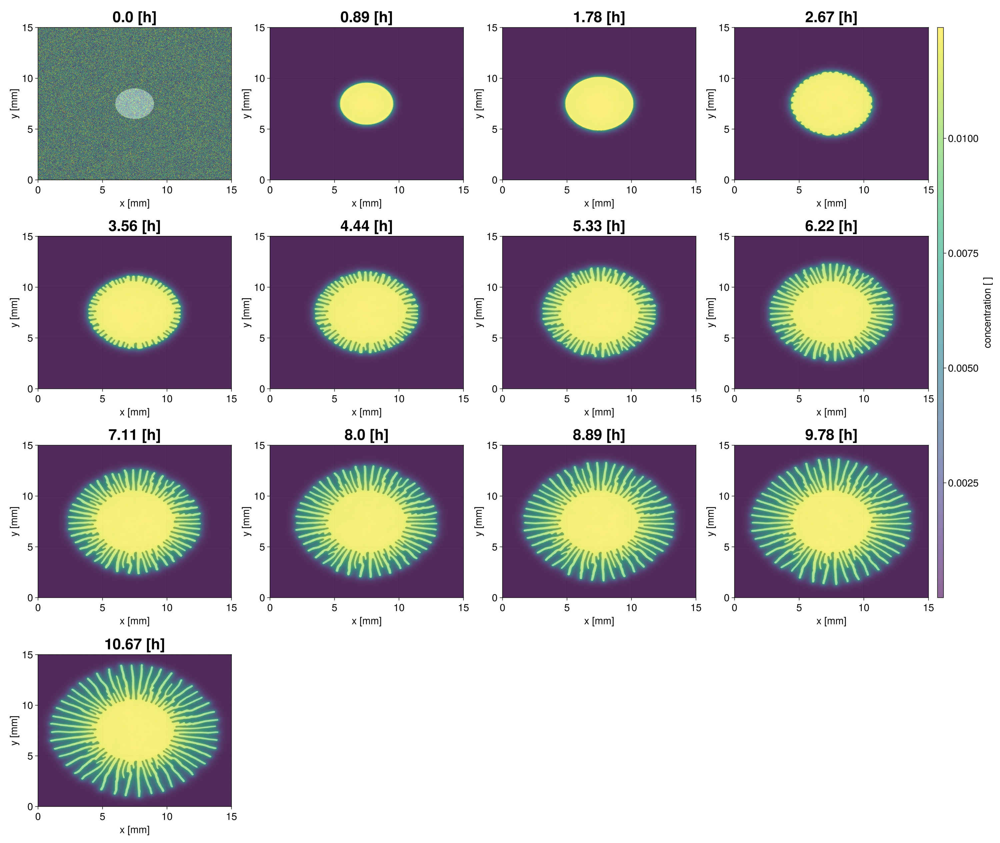

In [26]:
Makie.inline!(true)  
update_theme!(Theme(fontsize = 20))

range = collect(1:16:length(data[1]))

plt_n = 1

size = res_scaling(length(range), factor = 2.0 , plots = plt_n,plots_per_row = 4)

fig = Figure(size = size)
x_c = data[4].xc_w*1000
y_c = data[4].yc_w*1000

hm = 0
c = 0
for i in range 
    ax = Axis(fig[c÷4+1,(c%4+1)], title = "$(round(data_used.sampling_interval[1]*(i-1)/3600,digits = 2)) [h]", titlesize = 30, xlabel = "x [mm]", ylabel = "y [mm]")
    hm2 = heatmap!(ax,x_c,y_c, b_w_im(data[2][i]), colormap = (:bone, 0.6))
    hm = heatmap!(ax,x_c,y_c, data[3][i], colormap = (:viridis,0.6))
    c += 1  
end

Colorbar(fig[1:3, end+1], hm, label = "concentration [ ]")
#supertitle = Label(fig[0, :], "$(s_p)=$(getproperty(data[4].pa_ph,Symbol(s_p)))", fontsize = 50)

display(fig)
mkpath(data_used.path[1]*"\\analysis\\single")
save(data_used.path[1]*"\\analysis\\single\\default_para.png", fig,size = size)


### Make video of expanding colony

In [ ]:
Makie.inline!(false)  
range = collect(1:1:length(data[1]))
push!(range, length(data[1]))

Plot_parameter = plot_parameters(framerate = 10)
update_theme!(Theme(fontsize = 40))


plt_n = 1


fig = Figure(size = (1800,2000))
x_c = data[4].xc_w*1000
y_c = data[4].yc_w*1000

t = Observable(1)

title_name = @lift "$(round(data_used.sampling_interval[1]*($(t)-1)/3600,digits = 2)) [h], N = $(round(Int, length(data[1][$(t)])))"

ax = Axis(fig[1,1], title = title_name, titlesize = 40, xlabel = "x [mm]", ylabel = "y [mm]")
hm2 = heatmap!(ax,x_c,y_c, b_w_im(data[2][1]), colormap = (:bone, 0.6))
hm = heatmap!(ax,x_c,y_c, data[3][1], colormap = (:viridis,0.6))

Colorbar(fig[1:1, end+1], hm, label = "concentration [ ]")
display(fig)


record(fig, "vids/TrypColonies_gradient_new.mp4",  range, framerate = Plot_parameter.framerate) do i
    t[] = i
    Makie.update!(hm2,x_c,y_c, b_w_im(data[2][i]))
    Makie.update!(hm,x_c,y_c, data[3][i])
    sleep(0.01)
    #isopen(fig.scene) || break
    
end


"vids/TrypColonies_gradient_new.mp4"

### With agents

In [21]:
range = collect(1:1:length(data[1]))
push!(range, length(data[1]))

para = data[4]
Plot_parameter = plot_parameters(framerate = 5);
#update_theme!(Theme(fontsize = 20))


plt_n = 1


fig = Figure(size = (1800,2000))
x_c = data[4].xc_w
y_c = data[4].yc_w

t = Observable(1)

title_name = @lift "$(round(data_used.sampling_interval[1]*($(t)-1)/3600,digits = 2)) [h], N = $(round(Int, length(data[1][$(t)])))"
lim = Observable((0.0,0.015,0.0,0.015))

ax = Axis(fig[1,1], title = title_name, titlesize = 40, xlabel = "x [mm]", ylabel = "y [mm]", limits = lim)
hm2 = heatmap!(ax,x_c,y_c, b_w_im(data[2][end]), colormap = (:bone, 0.6))
hm = heatmap!(ax,x_c,y_c, data[3][end], colormap = (:viridis,0.6))

Full_Agent_list  = data[1][end];
x = [i.x_pos/para.arrow_to_grid_fac_x for i in Full_Agent_list]
y =  [i.y_pos/para.arrow_to_grid_fac_y for i in Full_Agent_list]
u = [i.dir_x for i in Full_Agent_list]
v = [i.dir_y for i in Full_Agent_list]
theta = (atan.(v ,u ))
color_scaled =  scale_color_map(Plot_parameter.Color_arrows,theta)


arrow = arrows2d!(ax,y, x, v, u,#  tipwidth = 0000001, tiplength = 0000001,
    lengthscale = 0.00002,
    tipcolor = theta, shaftcolor = theta,colormap =color_scaled)


Colorbar(fig[1:1, end+1], hm, label = "concentration [ ]")
display(fig)

"""

for i in range 
    t[] = i

    fac = i/steps
    lim[] = (0.0+ 0.015*(fac/8), 0.015/(1+fac*2), 0.0 + 0.015*(fac/8), 0.015/(1+fac*2))
    Full_Agent_list  = data[1][i]
    x = [i.x_pos/para.arrow_to_grid_fac_x for i in Full_Agent_list]
    y =  [i.y_pos/para.arrow_to_grid_fac_y for i in Full_Agent_list]
    u = [i.dir_x for i in Full_Agent_list]
    v = [i.dir_y for i in Full_Agent_list]
    theta = (atan.(v ,u ))

    Makie.update!(hm2,x_c,y_c, b_w_im(data[2][i]))
    Makie.update!(hm,x_c,y_c, data[3][i])
    Makie.update!(arrow, y, x, v, u, shaftcolor = theta, tipcolor = theta)
    

    sleep(0.1)
     isopen(fig.scene) || break
end
"""


record(fig, "vids/TrypColonies_with_arrows_no_zoom.mp4",  range, framerate = Plot_parameter.framerate, compression = 7) do i
    t[] = i

    #fac = i/steps
    #lim[] = (0.0+ 0.015*(fac/8), 0.015/(1+fac*2), 0.0 + 0.015*(fac/8), 0.015/(1+fac*2))
    Full_Agent_list  = data[1][i]
    x = [i.x_pos/para.arrow_to_grid_fac_x for i in Full_Agent_list]
    y =  [i.y_pos/para.arrow_to_grid_fac_y for i in Full_Agent_list]
    u = [i.dir_x for i in Full_Agent_list]
    v = [i.dir_y for i in Full_Agent_list]
    theta = (atan.(v ,u ))
    

    Makie.update!(hm2,x_c,y_c, b_w_im(data[2][i]))
    Makie.update!(hm,x_c,y_c, data[3][i])
    Makie.update!(arrow, y, x, v, u, shaftcolor = theta, tipcolor = theta)
    
end




"vids/TrypColonies_with_arrows_no_zoom.mp4"

### zoomikus

In [25]:
range = collect(1:1:length(data[1]))

steps = length(data[1])
push!(range, length(data[1]))


#update_theme!(Theme(fontsize = 20))


plt_n = 1


fig = Figure(size = (1800,2000))
x_c = data[4].xc_w
y_c = data[4].yc_w

t = Observable(1)

title_name = @lift "$(round(data_used.sampling_interval[1]*($(t)-1)/3600,digits = 2)) [h], N = $(round(Int, length(data[1][$(t)])))"
lim = Observable((0.0,0.015,0.0,0.015))
ax = Axis(fig[1,1], title = title_name, titlesize = 40, xlabel = "x [mm]", ylabel = "y [mm]", limits = lim)
hm2 = heatmap!(ax,x_c,y_c, b_w_im(data[2][1]), colormap = (:bone, 0.6))
hm = heatmap!(ax,x_c,y_c, data[3][1], colormap = (:viridis,0.6))

Colorbar(fig[1:1, end+1], hm, label = "concentration [ ]")
display(fig)
"""

for i in range 
    t[] = i
    
    #fac = 1.0 + 2*i/steps
    #lim[] = (0.0, 0.015/fac, 0.0, 0.015/fac)
    
    fac = i/steps
    lim[] = (0.0+ 0.015*(fac/4), 0.015/(1+fac*2), 0.0 + 0.015*(fac/4), 0.015/(1+fac*2))


    #Makie.update!(ax,x_c,y_c, limits = (0.0, 0.03/fac, 0.0, 0.03/fac))
    Makie.update!(hm2,x_c,y_c, b_w_im(data[2][i]))
    Makie.update!(hm,x_c,y_c, data[3][i])
    sleep(0.01)
    isopen(fig.scene) || break
end
"""

record(fig, "vids/TrypColonies_gradient_zoom_compres_t.mp4",  range, framerate = Plot_parameter.framerate) do i
    t[] = i
    fac = i/steps
    lim[] = (0.0+ 0.015*(fac/8), 0.015/(1+fac*2), 0.0 + 0.015*(fac/8), 0.015/(1+fac*2))
    #Makie.update!(ax,x_c,y_c, limits = (0.0, 0.03/fac, 0.0, 0.03/fac))
    Makie.update!(hm2,x_c,y_c, b_w_im(data[2][i]))
    Makie.update!(hm,x_c,y_c, data[3][i])
    sleep(0.01)
    
end



"vids/TrypColonies_gradient_zoom_compres_t.mp4"

### with agents  

In [26]:
range = collect(1:1:length(data[1]))
push!(range, length(data[1]))

para = data[4]
Plot_parameter = plot_parameters(framerate = 5);
#update_theme!(Theme(fontsize = 20))


plt_n = 1


fig = Figure(size = (1800,2000))
x_c = data[4].xc_w
y_c = data[4].yc_w

t = Observable(1)

title_name = @lift "$(round(data_used.sampling_interval[1]*($(t)-1)/3600,digits = 2)) [h], N = $(round(Int, length(data[1][$(t)])))"
lim = Observable((0.0,0.015,0.0,0.015))

ax = Axis(fig[1,1], title = title_name, titlesize = 40, xlabel = "x [mm]", ylabel = "y [mm]", limits = lim)
hm2 = heatmap!(ax,x_c,y_c, b_w_im(data[2][end]), colormap = (:bone, 0.6))
hm = heatmap!(ax,x_c,y_c, data[3][end], colormap = (:viridis,0.6))

Full_Agent_list  = data[1][end];
x = [i.x_pos/para.arrow_to_grid_fac_x for i in Full_Agent_list]
y =  [i.y_pos/para.arrow_to_grid_fac_y for i in Full_Agent_list]
u = [i.dir_x for i in Full_Agent_list]
v = [i.dir_y for i in Full_Agent_list]
theta = (atan.(v ,u ))
color_scaled =  scale_color_map(Plot_parameter.Color_arrows,theta)


arrow = arrows2d!(ax,y, x, v, u,#  tipwidth = 0000001, tiplength = 0000001,
    lengthscale = 0.00002,
    tipcolor = theta, shaftcolor = theta,colormap =color_scaled)


Colorbar(fig[1:1, end+1], hm, label = "concentration [ ]")
display(fig)

"""

for i in range 
    t[] = i

    fac = i/steps
    lim[] = (0.0+ 0.015*(fac/8), 0.015/(1+fac*2), 0.0 + 0.015*(fac/8), 0.015/(1+fac*2))
    Full_Agent_list  = data[1][i]
    x = [i.x_pos/para.arrow_to_grid_fac_x for i in Full_Agent_list]
    y =  [i.y_pos/para.arrow_to_grid_fac_y for i in Full_Agent_list]
    u = [i.dir_x for i in Full_Agent_list]
    v = [i.dir_y for i in Full_Agent_list]
    theta = (atan.(v ,u ))

    Makie.update!(hm2,x_c,y_c, b_w_im(data[2][i]))
    Makie.update!(hm,x_c,y_c, data[3][i])
    Makie.update!(arrow, y, x, v, u, shaftcolor = theta, tipcolor = theta)
    

    sleep(0.1)
     isopen(fig.scene) || break
end

"""

record(fig, "vids/TrypColonies_with_arrows2_compress_4.mp4",  range, framerate = Plot_parameter.framerate, compression = 4) do i
    t[] = i

    fac = i/steps
    lim[] = (0.0+ 0.015*(fac/8), 0.015/(1+fac*2), 0.0 + 0.015*(fac/8), 0.015/(1+fac*2))
    Full_Agent_list  = data[1][i]
    x = [i.x_pos/para.arrow_to_grid_fac_x for i in Full_Agent_list]
    y =  [i.y_pos/para.arrow_to_grid_fac_y for i in Full_Agent_list]
    u = [i.dir_x for i in Full_Agent_list]
    v = [i.dir_y for i in Full_Agent_list]
    theta = (atan.(v ,u ))
    

    Makie.update!(hm2,x_c,y_c, b_w_im(data[2][i]))
    Makie.update!(hm,x_c,y_c, data[3][i])
    Makie.update!(arrow, y, x, v, u, shaftcolor = theta, tipcolor = theta)
    
end



"vids/TrypColonies_with_arrows2_compress_4.mp4"

In [22]:
para = data[4];

In [23]:
Full_Agent_list  = data[1][1];
Plot_parameter = plot_parameters();

In [24]:
maximum(x)

10

┌ Warning: `arrows` are deprecated in favor of `arrows2d` and `arrows3d`.
└ @ Makie C:\Users\Andreas\.julia\packages\Makie\4JW9B\src\basic_recipes\arrows.jl:166
┌ Warning: linecolor has been renamed to shaftcolor.
└ @ Makie C:\Users\Andreas\.julia\packages\Makie\4JW9B\src\basic_recipes\arrows.jl:198
┌ Warning: arrowsize has been deprecated in favor of tipwidth and tiplength.
└ @ Makie C:\Users\Andreas\.julia\packages\Makie\4JW9B\src\basic_recipes\arrows.jl:206
┌ Warning: arrowcolor has been renamed to tipcolor.
└ @ Makie C:\Users\Andreas\.julia\packages\Makie\4JW9B\src\basic_recipes\arrows.jl:198
┌ Warning: `arrows` are deprecated in favor of `arrows2d` and `arrows3d`.
└ @ Makie C:\Users\Andreas\.julia\packages\Makie\4JW9B\src\basic_recipes\arrows.jl:166
┌ Warning: linecolor has been renamed to shaftcolor.
└ @ Makie C:\Users\Andreas\.julia\packages\Makie\4JW9B\src\basic_recipes\arrows.jl:198
┌ Warning: arrowsize has been deprecated in favor of tipwidth and tiplength.
└ @ Makie C:\Users

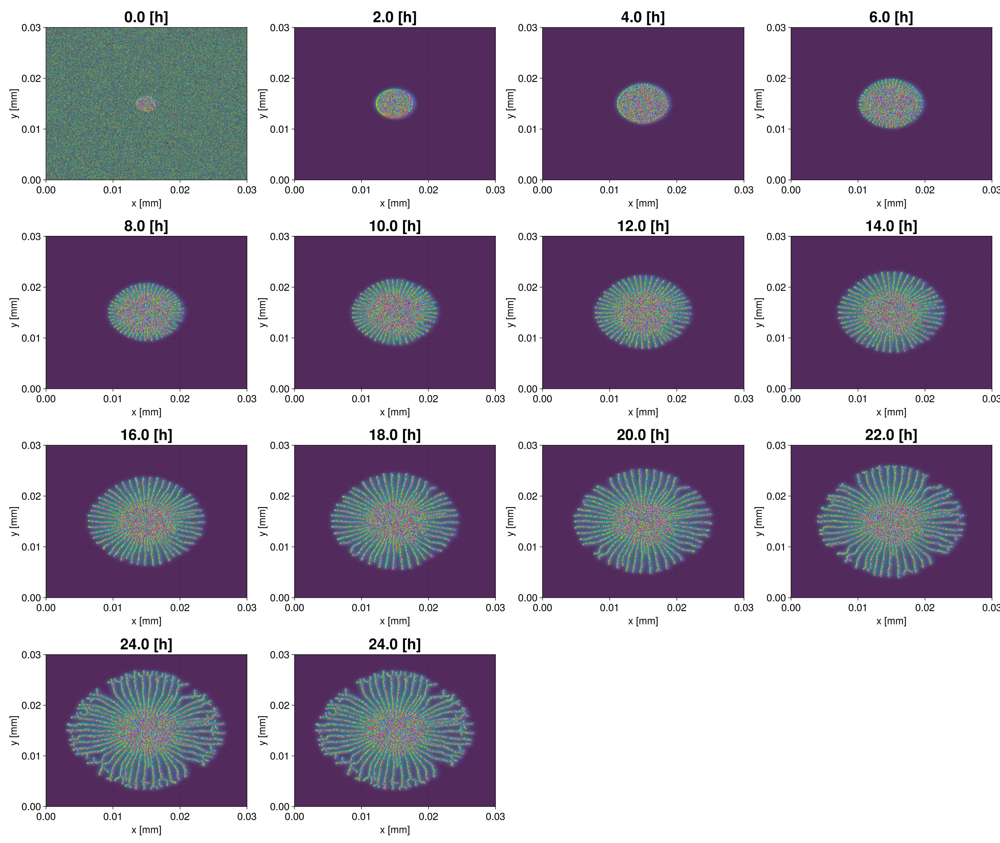

In [25]:
update_theme!(Theme(fontsize = 20))

it = 1 * data_used.iterations[1] 
data = s.deserialize(path_vec[1][it])
range = collect(1:4:length(data[1]))
push!(range, length(data[1]))
plt_n = 1

size = res_scaling(length(range), factor = 2.0 , plots = plt_n,plots_per_row = 4)

fig = Figure(size = size)
x_c = data[4].xc_w
y_c = data[4].yc_w

hm = 0
c = 0
for i in range 
    ax = Axis(fig[c÷4+1,(c%4+1)], title = "$(round(data_used.sampling_interval[1]*(i-1)/3600,digits = 2)) [h]", titlesize = 30, xlabel = "x [mm]", ylabel = "y [mm]")
    hm2 = heatmap!(ax,x_c,y_c, b_w_im(data[2][i]), colormap = (:bone, 0.6))
    hm = heatmap!(ax,x_c,y_c, data[3][i], colormap = (:viridis,0.6))

    Full_Agent_list  = data[1][i];
    x = [i.x_pos/para.arrow_to_grid_fac_x for i in Full_Agent_list]
    y =  [i.y_pos/para.arrow_to_grid_fac_y for i in Full_Agent_list]
    u = [i.dir_x for i in Full_Agent_list]
    v = [i.dir_y for i in Full_Agent_list]
    theta = (atan.(v ,u ))
    color_scaled =  scale_color_map(Plot_parameter.Color_arrows,theta)

    arrows!(ax,y, x, v, u, arrowsize = 0.000001, 
        lengthscale = 0.000001,
        arrowcolor = theta, linecolor = theta,colormap =color_scaled)
    c += 1  
end

#Colorbar(fig[1:3, end+1], hm, label = "concentration [ ]")
#supertitle = Label(fig[0, :], "$(s_p)=$(getproperty(data[4].pa_ph,Symbol(s_p)))", fontsize = 50)

display(fig)
mkpath(data_used.path[1]*"\\analysis\\single")
save(data_used.path[1]*"\\analysis\\single\\default_para_particles.png", fig,size = size)


┌ Warning: `arrows` are deprecated in favor of `arrows2d` and `arrows3d`.
└ @ Makie C:\Users\Andreas\.julia\packages\Makie\4JW9B\src\basic_recipes\arrows.jl:166
┌ Warning: linecolor has been renamed to shaftcolor.
└ @ Makie C:\Users\Andreas\.julia\packages\Makie\4JW9B\src\basic_recipes\arrows.jl:198
┌ Warning: arrowsize has been deprecated in favor of tipwidth and tiplength.
└ @ Makie C:\Users\Andreas\.julia\packages\Makie\4JW9B\src\basic_recipes\arrows.jl:206
┌ Warning: arrowcolor has been renamed to tipcolor.
└ @ Makie C:\Users\Andreas\.julia\packages\Makie\4JW9B\src\basic_recipes\arrows.jl:198


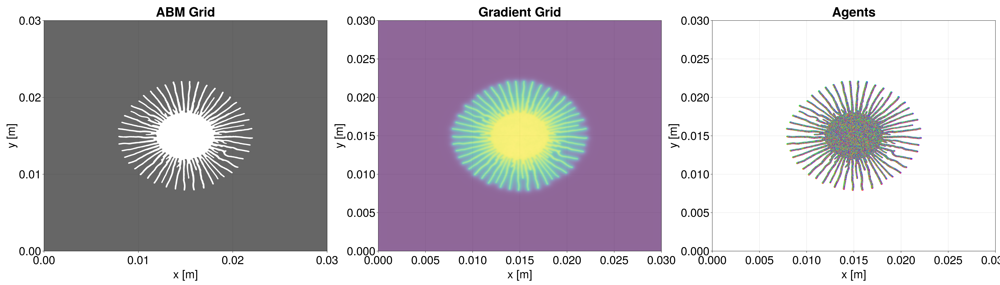

In [28]:
update_theme!(Theme(fontsize = 40))

it = 1 * data_used.iterations[1] 
data = s.deserialize(path_vec[1][it])
range = collect(1:2:length(data[1]))
push!(range, length(data[1]))
plt_n = 1

#size = res_scaling(length(range), factor = 2.0 , plots = plt_n,plots_per_row = 4)
size = (3500,1000)
fig = Figure(size = size)
x_c = data[4].xc_w
y_c = data[4].yc_w

hm = 0
c = 0
i = 25 
    ax = Axis(fig[1,1], title = "ABM Grid", titlesize = 45, xlabel = "x [m]", ylabel = "y [m]")
    hm2 = heatmap!(ax,x_c,y_c, b_w_im(data[2][i]), colormap = (:bone, 0.6))

    ax2 = Axis(fig[1,2], title = "Gradient Grid", titlesize = 45, xlabel = "x [m]", ylabel = "y [m]")
    hm = heatmap!(ax2,x_c,y_c, data[3][i], colormap = (:viridis,0.6))

    ax3 = Axis(fig[1,3], title = "Agents", titlesize = 45, xlabel = "x [m]", ylabel = "y [m]",limits = (0, 0.03,0, 0.03))
    Full_Agent_list  = data[1][i];
    x = [i.x_pos/para.arrow_to_grid_fac_x for i in Full_Agent_list]
    y =  [i.y_pos/para.arrow_to_grid_fac_y for i in Full_Agent_list]
    u = [i.dir_x for i in Full_Agent_list]
    v = [i.dir_y for i in Full_Agent_list]
    theta = (atan.(v ,u ))
    color_scaled =  scale_color_map(Plot_parameter.Color_arrows,theta)

    arrows!(ax3,y, x, v, u, arrowsize = 0.000001, 
        lengthscale = 0.00002,
        arrowcolor = theta, linecolor = theta,colormap =color_scaled)
    c += 1  


#Colorbar(fig[1:3, end+1], hm, label = "concentration [ ]")
#supertitle = Label(fig[0, :], "$(s_p)=$(getproperty(data[4].pa_ph,Symbol(s_p)))", fontsize = 50)

display(fig)
mkpath(data_used.path[1]*"\\analysis\\single")
save(data_used.path[1]*"\\analysis\\single\\default_separate.png", fig,size = size)
